# Распознование текста из таблиц на загружаемых фотографиях

**Цель проекта**: Подготовить рабочее решение, которое позволит извлекать из отсканированных или сфотографированных справок по форме 405 данные о донации крови, в частности:
   - полную дату донации
   - тип донации
   - вид донации


 
 **Основные этапы проекта**:
 1. Детекция табличных данных
 2. Предобработка фотографий
 3. Детекция и распознование текста с таблиц

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import os
import gc
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
import math
import re

from tqdm import tqdm, tqdm_notebook
import cv2
from PIL import Image
from IPython.display import clear_output

import torch
import torchvision
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from torch import nn
from transformers import AdamW
from torch.optim.lr_scheduler import StepLR
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torchvision.ops.boxes import nms

import easyocr

np.random.seed(12345)
torch.manual_seed(12345)
torch.cuda.manual_seed(12345)

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

easyocr = easyocr.Reader(['ru'])

Progress: |██████████████████████████████████████████████████| 100.1% Complete

In [3]:
directory = '/kaggle/working/'

## 1. Детекция таблиц

Здесь предполагается рассмотреть несколько вариантов:
 - использование нейронной сети для детекции 
 - использование встроенных методов ocv

### 1.1. Обучение нейронной сети для детекции таблиц

Для детекции будем использовать готовую модель  FAST-RCNN из библиотеки pytorch.
Склонируем репозиторий с данными и подготовим их для дальнейшего обучения.

In [ ]:
!git clone https://github.com/sgrpanchal31/table-detection-dataset.git

Хорошо, теперь у нас есть необходимые данные для обучения и валидации. Посмотрим на них. Как можно увидеть, все координаты боксов разнесены по отдельным столбцам. Сперва нам их нужно объеденить в список. Предполагается, что на отдельный бокс будет отдельный список.

In [4]:
df_train = pd.read_csv(directory+'table-detection-dataset/train.csv',
                       names=['filename', 'xmin', 'ymin', 'xmax' , 'ymax', 'class'])
df_val = pd.read_csv(directory+'table-detection-dataset/val.csv',
                    names=['filename', 'xmin', 'ymin', 'xmax' , 'ymax', 'class'])

df_train.head(1)

,filename,xmin,ymin,xmax,ymax,class
0,0101_003.png,770,946,2070,2973,table


In [6]:
#соберем координаты каждого из боксов в отдельный список
df_train['bbox'] = df_train[['xmin', 'ymin', 'xmax' , 'ymax']].apply(list, axis=1)
df_val['bbox'] = df_val[['xmin', 'ymin', 'xmax' , 'ymax']].apply(list, axis=1)

df_train['class'] = df_train['class'].map({'table': 1})
df_val['class'] = df_val['class'].map({'table': 1})

df_train = df_train.drop(columns=['xmin', 'ymin', 'xmax' , 'ymax']).groupby('filename', as_index=False).agg(list)
df_val = df_val.drop(columns=['xmin', 'ymin', 'xmax' , 'ymax']).groupby('filename', as_index=False).agg(list)

In [4]:
#отрисовка картинок для разных входных данных
def imshow(inp,  title=None, plt_ax=plt, default=False, mode=None, color = None):
    if mode=='tensor':
        inp = inp.numpy().transpose((1, 2, 0))
        inp = np.clip(inp, 0, 1)
        plt_ax.imshow(inp, 'gray')
    else:
        plt_ax.imshow(inp, cmap=color)
    try:
        if title is not None:
            plt_ax.set_title(title)
    except:
        plt.title(title)
    plt_ax.grid(False)

In [8]:
#отрисовка картинки и бокса
def draw_img_with_box(df_index, scale_percent=100):
    path_to_img = os.path.join(directory+'table-detection-dataset/images', df_train.loc[df_index, 'filename'])
    img = cv2.imread(path_to_img)
    boxes = df_train.loc[df_index, 'bbox']
    for box in boxes:
        cv2.rectangle(img, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), (255, 0, 0), 5)
        width = int(img.shape[1] * scale_percent / 100)
        height = int(img.shape[0] * scale_percent / 100)
        dim = (width, height)
        img = cv2.resize(img, dim)
        imshow(img)

Посмотрим что получилось на рандомном файле.

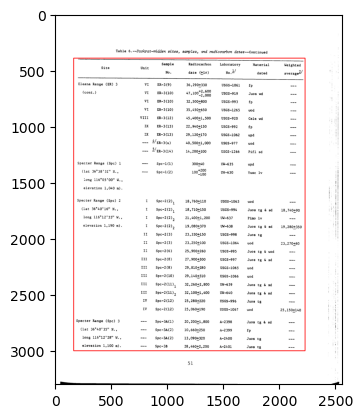

In [9]:
#посмотрим радномную картинку из валидационного датасета
random_doc = int(np.random.uniform(0,len(df_val)))
draw_img_with_box(random_doc)

Теперь напишем функцию, которая будет инициализировать модель

In [11]:
#инициализация модели
def create_model(num_classes, pretrained=False):
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=pretrained)
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    return model

Исходная модель рассчитана на детекцию 91 класса. Нам нужно детектировать только один объект, поэтому необходимо заменить box_predictor внутри модели. Меняем количество выходов на 2, потому что нулевым классом должен быть фон.

Создадим класс TableDocsDataset который на выходе даст нам тензоры изображений и словарь с метками

In [10]:
class TableDocsDataset(Dataset):

    def __init__(self, dataframe, img_path):

        self.df = dataframe
        self.img_path = img_path

    def __len__(self):
        return self.df.shape[0]

    def __getitem__(self, index):
        img_name = self.df.loc[index,'filename']
        boxes = torch.Tensor(self.df.loc[index, 'bbox']).to(torch.float)
        labels = torch.Tensor(self.df.loc[index, 'class']).to(torch.int64)
        area = (boxes[:, 2] - boxes[:, 0]) * (boxes[:, 3] - boxes[:, 0])
        iscrowd = torch.zeros(labels.shape[0], dtype=torch.int64)

        target = {
            'boxes': boxes,
            'labels': labels
        }

        img = cv2.imread(os.path.join(self.img_path, img_name))/255.
        img = torch.from_numpy(img).permute(2, 0, 1).to(torch.float)
        return img, target

In [12]:
def collate_fn(batch):
    return tuple(zip(*batch))

train_dataset = TableDocsDataset(df_train, directory+'table-detection-dataset/images')
val_dataset = TableDocsDataset(df_val, directory+'table-detection-dataset/images')

train_data_loader = DataLoader(
    train_dataset,
    batch_size=3,
    shuffle=True,
    collate_fn=collate_fn
)

val_data_loader = DataLoader(
    val_dataset,
    batch_size=3,
    shuffle=False,
    collate_fn=collate_fn
)

loaders = {'train': train_data_loader, 'valid': val_data_loader}

Еще нам потребуется функция обучения нейронной сети, визуализация метрик в процессе обучения и результата детекции.

In [14]:
#визуализация метрик 
def show_result(data, threshold=0.02):
    plt.figure(figsize=(8, 5))

    sns.lineplot(data=data, x='epoch', y='train_loss', color = 'darkcyan')
    sns.lineplot(data=data, x='epoch', y='valid_loss', color = 'cornflowerblue')
    sns.lineplot(data=data, x='epoch', y=threshold, style=True, dashes=[(3,3)], color = 'tan')
    plt.ylabel('loss')
    plt.legend(['train_loss', 'valid_loss'])
    plt.title('Loss values')

    plt.show()

In [19]:
#вывод предсказания границ бокса на валидации
def draw_predict(df_index, df, model, iou_threshold=0.1, threshold=0.8, scale_percent=100):
    model.eval()
    img = cv2.imread(os.path.join(directory+'table-detection-dataset/images', df.loc[df_index, 'filename']))
    img_ = img / 255.
    img_ = torch.from_numpy(img_).permute(2, 0, 1).unsqueeze(0).to(torch.float).to(device)
    predict = model(img_)
    ind = nms(predict[0]['boxes'], predict[0]['scores'], iou_threshold).detach().cpu().numpy()
    for i, box in enumerate(predict[0]['boxes'][ind]):
        if predict[0]['scores'][i] > threshold:
            cv2.rectangle(img,
                    (int(box[0]), int(box[1])),
                    (int(box[2]), int(box[3])),
                    (255, 0, 0), 5)
    width = int(img.shape[1] * scale_percent / 100)
    height = int(img.shape[0] * scale_percent / 100)
    dim = (width, height)
    img = cv2.resize(img, dim)
    imshow(img)


In [17]:
#функция обучения
def train(model, opt, epochs, scheduler, loaders):
    best_score = 999999
    for epoch in tqdm(range(epochs)):
        result['epoch'].append(epoch)

        for mode, dataloader in loaders.items():
            running_loss, valid_loss = 0, 0
            for batch in dataloader:
                images, targets = batch[0], batch[1]
                images = list(image.to(device) for image in images)
                targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
                if mode =='train':
                    model.train()
                    opt.zero_grad()
                    loss_dict = model(images, targets)
                    loss = sum(loss for loss in loss_dict.values())
                else:
                    with torch.no_grad(): #проверяем на валидационном датасете
                        loss_dict = model(images, targets)
                        loss = sum(loss for loss in loss_dict.values())

                running_loss += loss.item()
                if mode =='train':
                    loss.backward()
                    opt.step()
            avg_loss = running_loss/len(dataloader.dataset)
            result[str(mode)+'_loss'].append(avg_loss)

            if mode =='valid':
                if avg_loss < best_score:
                    best_score = avg_loss
                    torch.save(model.state_dict(), f'fasterrcnn_resnet50_fpn_v1.pth') #сохраним веса для лучшей метрики на валидации
                valid_loss = avg_loss
            lr = optimizer.param_groups[0]['lr']
            scheduler.step() #уменьшим скорость обучения за заданный шаг

        clear_output(wait=True) #отчистим предыдущий вывод результатов
        print('%d / %d - validation loss: %f learning rate: %f' % (epoch+1, epochs, avg_loss, lr))
        show_result(result) #метрики

        draw_predict(random_doc, df_val, model) #результат детекции

        torch.cuda.empty_cache() #чистим кэш
        gc.collect()

20 / 20 - validation loss: 0.050109 learning rate: 0.000002


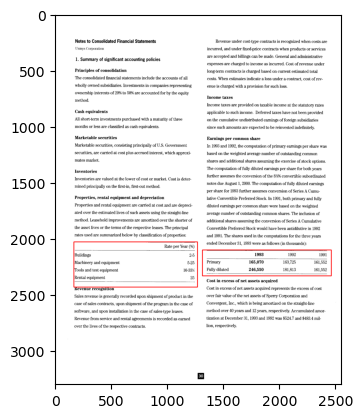

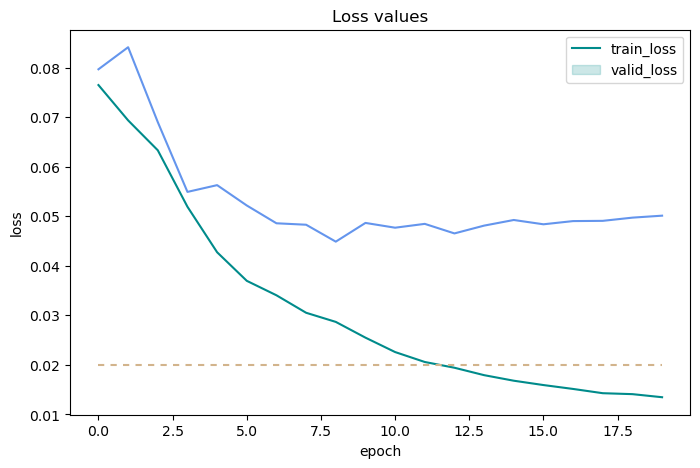

100%|██████████| 20/20 [36:27<00:00, 109.38s/it]


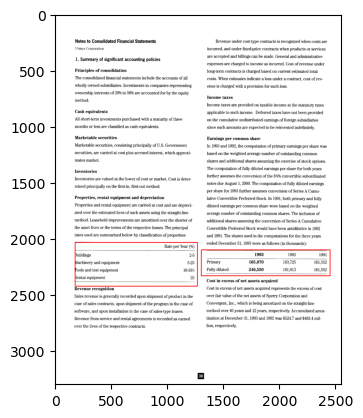

In [58]:
result = {'epoch': [],'train_loss': [],'valid_loss': []}

model = create_model(num_classes=2, pretrained=False).to(device)
optimizer = AdamW(model.parameters(), lr=1e-4, weight_decay=0.0005)
scheduler = StepLR(optimizer, step_size=1, gamma=0.9)
max_epochs = 20

train(model, optimizer, max_epochs, scheduler, loaders)

После 12 эпохи резутаты метрики на валидации выходят на плато. Модель начинает переобучаться. Но в принципе, как мы видим на результатирующем выводе, таблицу она находи верно, но немного сдвигаются границы бокса.

Сохраним веса. Теперь можно запустить модель на наших изображениях.

In [60]:
torch.save(model.state_dict(), 'fasterrcnn_resnet50_fpn_v0.pth')

In [61]:
model = create_model(2).to(device)
model.load_state_dict(torch.load('fasterrcnn_resnet50_fpn_v0.pth'))

<All keys matched successfully>

In [43]:
!kaggle datasets download -d irinamishneva/scanmedicalpaper
!unzip -q /kaggle/working/scanmedicalpaper.zip

scanmedicalpaper.zip: Skipping, found more recently modified local copy (use --force to force download)


In [5]:
PATH = directory+'image'
result = {
    'file_name':[]
}
for fl in os.listdir(PATH):
    result['file_name'].append(os.path.basename(fl))

TRAIN_DIR = Path(PATH)
train_val_files = sorted(list(TRAIN_DIR.rglob('*.jpg')))

PATH_table = directory+'table'
DIR_table = Path(PATH_table)
valid_tables = sorted(list(DIR_table.rglob('*.csv')))

Прежде чем запустить детекцию, подготовим еще одну функцию, которая вырежет продетектированные таблицы и сохранит их в отдельные файлы. Не забываем, что у нашей модели есть некоторые проблемы с границами, поэтому зададим ей еще небольшие отступы от бокса - для верхней и нижней границы - по 2-5%, по бокам обрезать вообще не будем.

In [63]:
#детекция таблицы и ее извлечение
def draw_predict_real_docs(file, iou_threshold=0., threshold=0.8, scale_percent=100):
    os.makedirs('outputs_d_tables', exist_ok=True)

    img = cv2.imread(str(file))
    crop_img = img[int(img.shape[0]/3):,]
    crop_img_ = crop_img/255.
    crop_img_ = torch.from_numpy(crop_img_).permute(2,0,1).unsqueeze(0).to(torch.float).to(device)

    model.eval()
    predict = model(crop_img_)
    ind = nms(predict[0]['boxes'], predict[0]['scores'], iou_threshold).detach().cpu().numpy()
    for i, box in enumerate(predict[0]['boxes'][ind]):
        if predict[0]['scores'][i] > threshold:
            crop_image = crop_img.copy()
            #нарисуем бокс
            cv2.rectangle(crop_img,
                    (int(box[0]), int(box[1])),
                    (int(box[2]), int(box[3])),
                    (255, 0, 0), 5)

            #границы обрезки по контурам бокса + небольшой запас по границам бокса
            border_up, border_down = int(crop_image.shape[0]*0.02), int(crop_image.shape[0]*0.055)
            carplate_image = crop_image[int(box[1])-border_up:int(box[3])+border_down,:]
            cv2.imwrite(directory+'outputs_d_tables/'+str(file).split('/')[-1], carplate_image)

    width = int(crop_img.shape[1] * scale_percent / 100)
    height = int(crop_img.shape[0] * scale_percent / 100)
    dim = (width, height)
    crop_img = cv2.resize(crop_img, dim)

    imshow(crop_img)

Посмотрим чсто получилось.

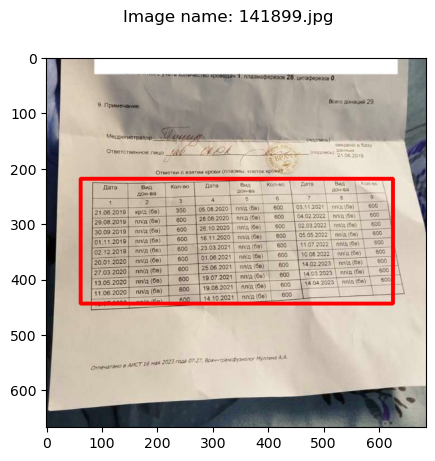

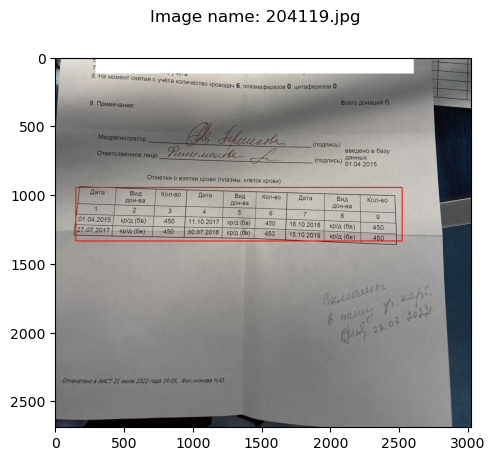

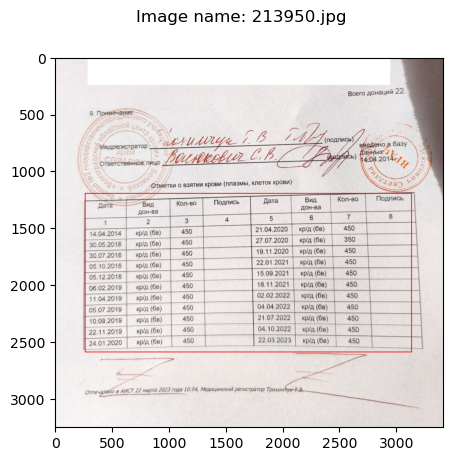

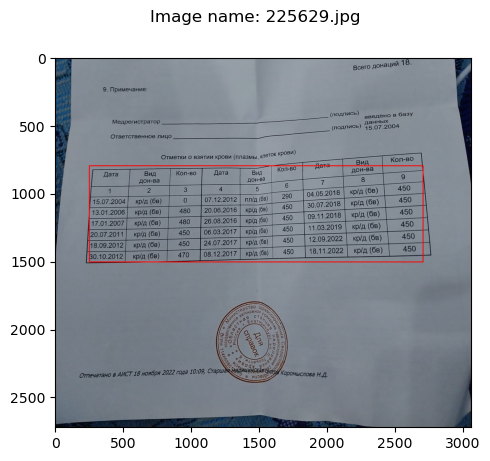

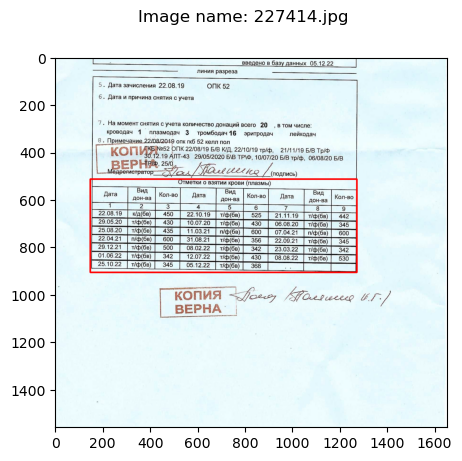

...

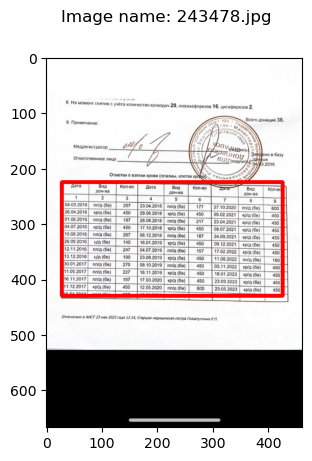

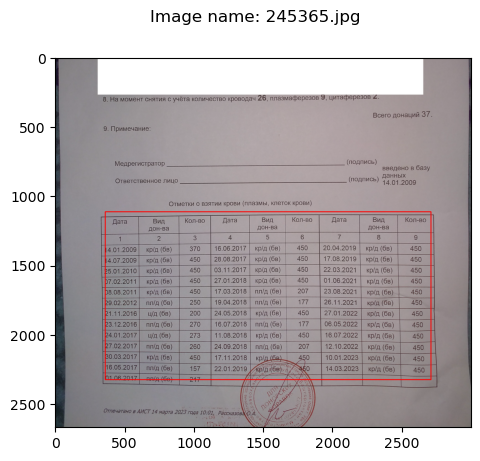

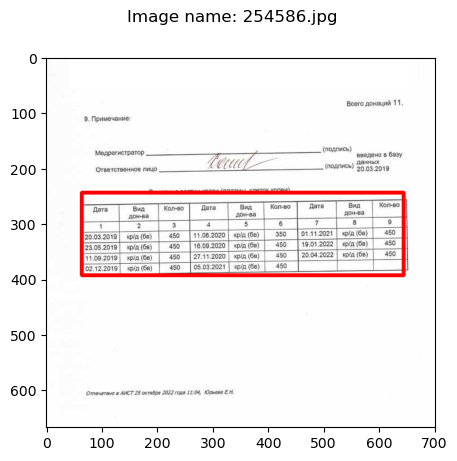

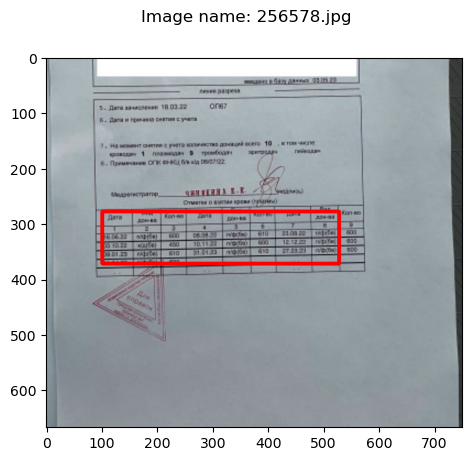

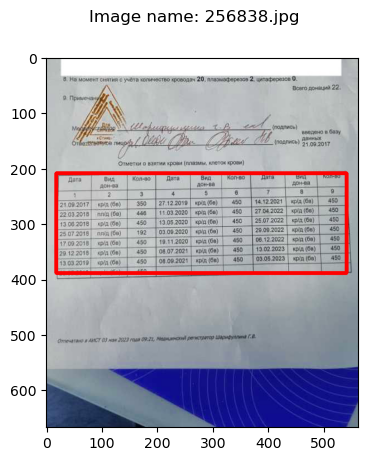

In [64]:
for file in train_val_files:
    draw_predict_real_docs(file,0.,0.8)
    file_name = str(file).split('/')[-1]
    plt.suptitle(f'Image name: {file_name}')
    plt.show()

## 1.2. Детекция методами OpenCV (проверка гипотезы)

В ходе работы была выдвинута гипотеза по детекции таблиц методами OpenCV. Было выделено 2 алгоритма для выделения таблицы на фото, для таблиц без печати и для таблиц, на границы которых заходила печать.

In [6]:
images_list_hypot = train_val_files.copy()

images_without_seal = [0, 1, 3, 4, 5, 6, 7, 9, 12, 14]
images_with_seal = [2, 8, 10, 11, 13]

In [7]:
# Функция для детекции таблиц без печатей
def detection_of_table_without_seal(image_path):
    image = cv2.imread(image_path)
    convert_image = cv2.resize(image.copy(), 
                               (1000,
                                int(image.shape[0] * 1000 / image.shape[1])),
                               interpolation=cv2.INTER_AREA)
    gray = cv2.cvtColor(convert_image, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    inverted_image = cv2.bitwise_not(blur)
   
    # Обнаружение границ в изображении с помощью оператора Canny
    edges = cv2.Canny(inverted_image, 50, 150, apertureSize=3)
   
    # Поиск контуров на изображении
    contours, _ = cv2.findContours(edges.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Фильтрация контуров по аппроксимации
    rectangles = []
    for contour in contours:
        perimeter = cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, 0.01 * perimeter, True)
        if len(approx) == 4:
            rectangles.append(approx)

    # Bщем максимальную площадь прямоугольника, будем думать, что это наша таблица
    max_area = 0
    contour_with_max_area = None
    for contour in rectangles:
        area = cv2.contourArea(contour)
        if area > max_area:
            max_area = area
            contour_with_max_area = contour

    #далее функции для выравнивания перспективы
    def order_points(pts):
        pts = pts.reshape(4, 2)
        rect = np.zeros((4, 2), dtype="float32")

        s = pts.sum(axis=1)
        rect[0] = pts[np.argmin(s)]
        rect[2] = pts[np.argmax(s)]

        diff = np.diff(pts, axis=1)
        rect[1] = pts[np.argmin(diff)]
        rect[3] = pts[np.argmax(diff)]

        return rect

    contour_with_max_area_ordered = order_points(contour_with_max_area)

    # рассчитываем новую высоту и ширину
    existing_image_width = convert_image.shape[1]
    existing_image_width_reduced_by_10_percent = int(existing_image_width * 0.9)

    def calculateDistanceBetween2Points(p1, p2):
        dis = ((p2[0] - p1[0]) ** 2 + (p2[1] - p1[1]) ** 2) ** 0.5
        return dis

    distance_between_top_left_and_top_right = calculateDistanceBetween2Points(contour_with_max_area_ordered[0], contour_with_max_area_ordered[1])
    distance_between_top_left_and_bottom_left = calculateDistanceBetween2Points(contour_with_max_area_ordered[0], contour_with_max_area_ordered[3])

    aspect_ratio = distance_between_top_left_and_bottom_left / distance_between_top_left_and_top_right

    new_image_width = existing_image_width_reduced_by_10_percent
    new_image_height = int(new_image_width * aspect_ratio)

    # apply_perspective_transform:
    pts1 = np.float32(contour_with_max_area_ordered)
    pts2 = np.float32([[0, 0], [new_image_width, 0], [new_image_width, new_image_height], [0, new_image_height]])
    matrix = cv2.getPerspectiveTransform(pts1, pts2)
    perspective_corrected_image = cv2.warpPerspective(convert_image, matrix, (new_image_width, new_image_height))
    
    imshow(perspective_corrected_image, color='gray')

Результаты работы данной функции приведены ниже.

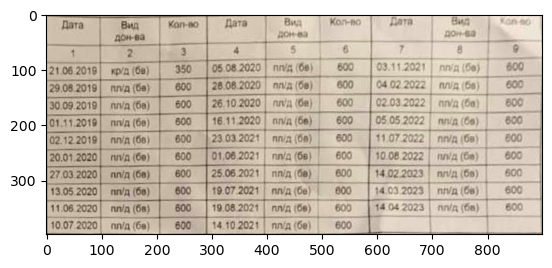

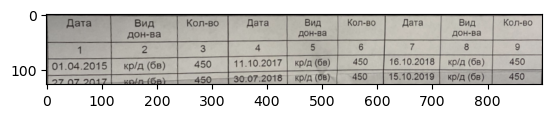

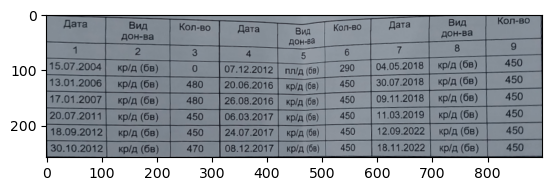

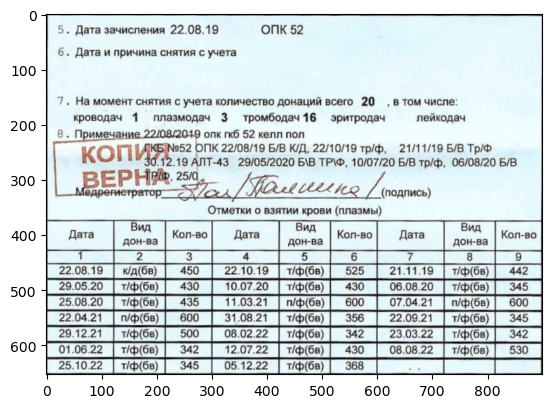

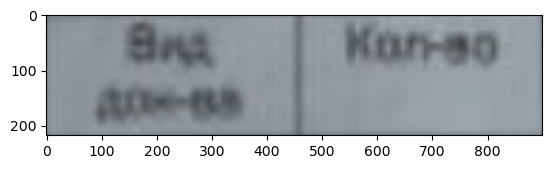

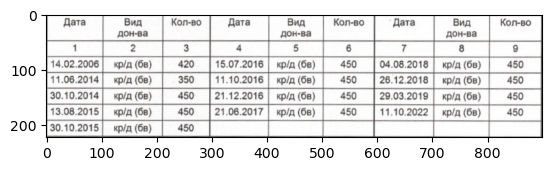

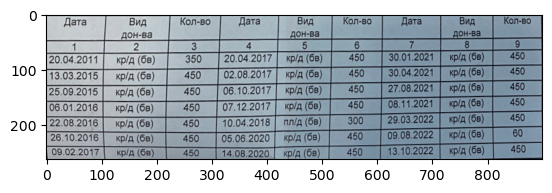

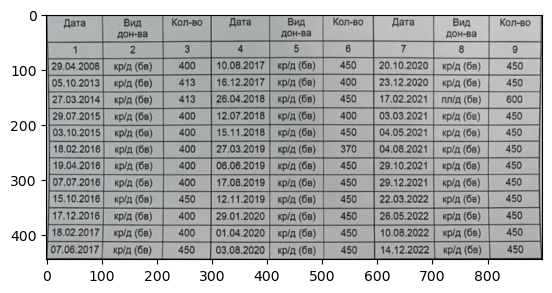

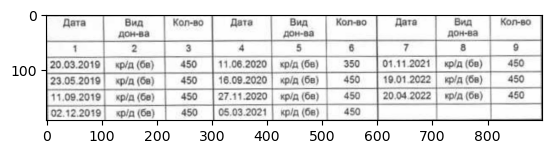

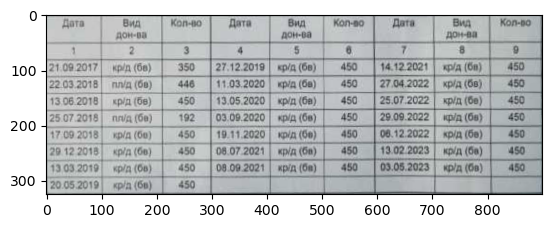

In [8]:
for i in images_without_seal:
    detection_of_table_without_seal(str(images_list_hypot[i]))
    plt.show()

In [9]:
# Функция для детекции таблиц с печатью
def detection_of_table_with_seal(image_path):   
    image = cv2.imread(image_path)
    convert_image = cv2.resize(image.copy(), 
                               (1000,
                                int(image.shape[0] * 1000 / image.shape[1])),
                               interpolation=cv2.INTER_AREA)
    gray = cv2.cvtColor(convert_image, cv2.COLOR_BGR2GRAY)

    # посчитаем среднюю яркость одного пикселя на фото.
    # в зависимости от этого устанавливается уровень фильтра theshold, когда ищем горизонтальные и вертикальные линии.
    total_brightness = gray.sum() / gray.shape[0] / gray.shape[1]
    if total_brightness < 200:
        threshold_level_for_line_filter = [110, 110]
    else:
        threshold_level_for_line_filter = [37, 80]
    
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    inverted_image = cv2.bitwise_not(blur)
    
    #ищем все цветные элементы(в т.ч. и печати), которые мешают
    def colored_mask(img, threshold = -1):
        # Размытие для удаления мелких шумов.
        denoised = cv2.medianBlur(img, 3)
        # Сохранение в ЧБ для получения маски.
        gray = cv2.cvtColor(denoised, cv2.COLOR_BGR2GRAY)
        # Получение цветной части изображения.
        adaptiveThreshold = threshold if threshold >= 0 else cv2.mean(img)[0]
        color = cv2.cvtColor(denoised, cv2.COLOR_BGR2HLS)
        
        mask = cv2.inRange(color, (0, int(adaptiveThreshold / 6), 60), (180, adaptiveThreshold, 255))

        # Создание маски цветной части изображения.
        dst = cv2.bitwise_and(gray, gray, mask=mask)
        return dst

    dts = colored_mask(convert_image.copy(), threshold = -1)

    # Расширение маски, чтобы все шумы закрыть
    kernel_dts = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2))
    dts = cv2.dilate(dts, kernel_dts, iterations=1)

    #Удаляем с инвертированной фотографии наши выделенные цветные элементы (печати)
    mask = cv2.subtract(inverted_image, dts)

    #Ищем горизонтальные линии:
    kernel_hor = cv2.getStructuringElement(cv2.MORPH_RECT, (4, 4))
    hor = np.array([[1,1,1,1,1,1]])
    vertical_lines_eroded_image = cv2.erode(mask, hor, iterations=5)
    #Расширяем линии
    vertical_lines_eroded_image = cv2.dilate(vertical_lines_eroded_image, hor, iterations=5)
    #Расширяем все
    vertical_lines_eroded_image = cv2.dilate(vertical_lines_eroded_image, kernel_hor, iterations=3)
    vertical_lines_eroded_image = cv2.adaptiveThreshold(vertical_lines_eroded_image, 231, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 15, 2)
    
    #Поиск вертикальных контуров аналогичным образом
    ver = np.array([[1],
                    [1],
                    [1],
                    [1],
                    [1],
                    [1],
                    [1]])
    horizontal_lines_eroded_image = cv2.erode(mask, ver, iterations=5)
    horizontal_lines_eroded_image = cv2.dilate(horizontal_lines_eroded_image, ver, iterations=5)
    horizontal_lines_eroded_image = cv2.dilate(horizontal_lines_eroded_image, kernel_hor, iterations=3)
    horizontal_lines_eroded_image = cv2.adaptiveThreshold(horizontal_lines_eroded_image, 231, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 15, 2)
    
    # соединяем все линии в одну картинку
    combined_image = cv2.add(vertical_lines_eroded_image, horizontal_lines_eroded_image)
    combined_image = 255 - combined_image
        
    # Обнаружение границ в изображении с помощью оператора Canny. 
    edges = cv2.Canny(combined_image, 50, 150, apertureSize=3)
    
    # Поиск контуров на изображении
    contours, _ = cv2.findContours(edges.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Фильтрация контуров по аппроксимации
    rectangles = []
    for contour in contours:
        perimeter = cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, 0.01 * perimeter, True)
        if len(approx) == 4:
            rectangles.append(approx)

    # Ищем максимальную площадь прямоугольника, будем думать, что это наша таблица
    max_area = 0
    contour_with_max_area = None
    for contour in rectangles:
        area = cv2.contourArea(contour)
        if area > max_area:
            max_area = area
            contour_with_max_area = contour
    image_with_contour_with_max_area = convert_image.copy()
#     picture = cv2.drawContours(image_with_contour_with_max_area, [contour_with_max_area], -1, (0, 255, 0), 3)
        
    #далее функции для выравнивания перспективы
    def order_points(pts):
        pts = pts.reshape(4, 2)
        rect = np.zeros((4, 2), dtype="float32")

        s = pts.sum(axis=1)
        rect[0] = pts[np.argmin(s)]
        rect[2] = pts[np.argmax(s)]

        diff = np.diff(pts, axis=1)
        rect[1] = pts[np.argmin(diff)]
        rect[3] = pts[np.argmax(diff)]

        return rect

    contour_with_max_area_ordered = order_points(contour_with_max_area)

    # рассчитываем новую высоту и ширину
    existing_image_width = convert_image.shape[1]
    existing_image_width_reduced_by_10_percent = int(existing_image_width * 0.9)

    def calculateDistanceBetween2Points(p1, p2):
        dis = ((p2[0] - p1[0]) ** 2 + (p2[1] - p1[1]) ** 2) ** 0.5
        return dis

    distance_between_top_left_and_top_right = calculateDistanceBetween2Points(contour_with_max_area_ordered[0], contour_with_max_area_ordered[1])
    distance_between_top_left_and_bottom_left = calculateDistanceBetween2Points(contour_with_max_area_ordered[0], contour_with_max_area_ordered[3])

    aspect_ratio = distance_between_top_left_and_bottom_left / distance_between_top_left_and_top_right

    new_image_width = existing_image_width_reduced_by_10_percent
    new_image_height = int(new_image_width * aspect_ratio)

    # apply_perspective_transform:
    pts1 = np.float32(contour_with_max_area_ordered)
    pts2 = np.float32([[0, 0], [new_image_width, 0], [new_image_width, new_image_height], [0, new_image_height]])
    matrix = cv2.getPerspectiveTransform(pts1, pts2)
    perspective_corrected_image = cv2.warpPerspective(convert_image, matrix, (new_image_width, new_image_height))
    
    imshow(perspective_corrected_image, color='gray')

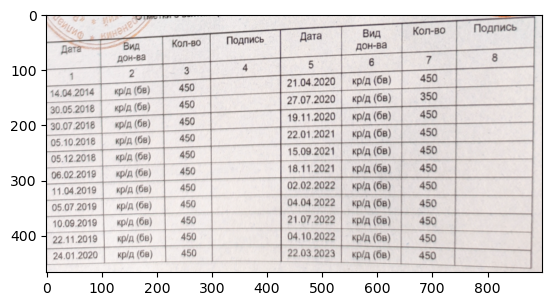

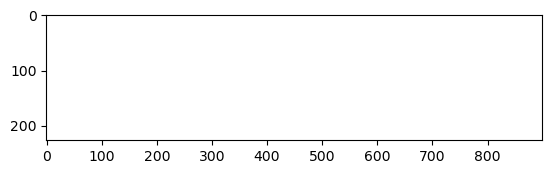

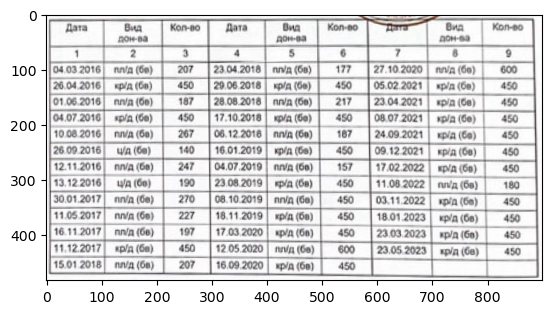

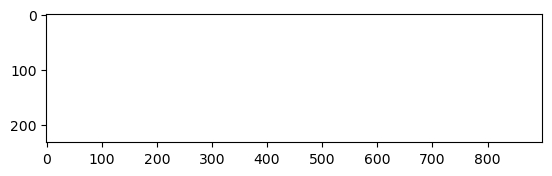

In [10]:
for i in images_with_seal:
    try:
        detection_of_table_with_seal(str(images_list_hypot[i]))
        plt.show()
    except:
        pass

Результаты получились довольно хорошие, однако алгоритм отработал корректно не на всех фото. В качестве рабочего алгоритма будет использовать детекцию с помощью обученной FAST RCNN.

## 2. Предобработка данных

Здесь у нас план следующий:
 - улучшим обрезанные фотографии с помощью регулировки яркости и контраста. Для того, чтобы не было сильного попиксельного размытия, переведем их в бОльший размер. 
 - выровняем таблицы по горизонтальным линиям
 - сделаем инверсию
 
 Промежуточные результаты будем сохранять в файлы

Сперва попробуем выпрямить немного изображение

In [11]:
def img_rotate(file, file_new_path=None):
    image = cv2.imread(str(file), cv2.IMREAD_GRAYSCALE) 
    final_image = cv2.imread(str(file), cv2.IMREAD_COLOR) 

    #очистка от шумов
    img_bw = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

    #изменение размера
    final_wide = 200 
    r = float(final_wide) / image.shape[1]
    dim = (final_wide, int(image.shape[0] * r))
    resized = cv2.resize(img_bw, dim, interpolation = cv2.INTER_AREA)

    #выделение границ Кэнни
    dst = cv2.Canny(resized,400,100)
    cdst = cv2.cvtColor(dst, cv2.COLOR_GRAY2BGR) 
    cdstP = np.copy(cdst) 

    #преобразование Хаффа
    lines = cv2.HoughLines(dst, 1, np.pi / 120, 100, None, 0, 0)
    coner_array = [] 
    if lines is not None: 
        for i in range(0, len(lines)): 
            rho = lines[i][0][0] 
            theta = lines[i][0][1] 
            a = math.cos(theta) 
            b = math.sin(theta) 
            x0 = a * rho 
            y0 = b * rho 
            pt1 = (int(x0 + 1000*(-b)), int(y0 + 1000*(a))) 
            pt2 = (int(x0 - 1000*(-b)), int(y0 - 1000*(a))) 
            cv2.line(cdst, pt1, pt2, (0,0,255), 1, cv2.LINE_AA) 

    linesP = cv2.HoughLinesP(dst, 1, np.pi / 180, 50, None, 20, 10)
    if linesP is not None: 
        for i in range(0, len(linesP)): 
            l = linesP[i][0] 
            cv2.line(cdstP, (l[0], l[1]), (l[2], l[3]), (0,0,255), 1, cv2.LINE_AA) 
            coner_array.append(math.degrees(math.atan((l[3]-l[1])/(l[2]-l[0]))))

    coner=np.mean(coner_array) 
    (h, w) = image.shape[:2] 
    center = (w / 2, h / 2)  
    M = cv2.getRotationMatrix2D(center, coner, 1.0) 
    binrotated = cv2.warpAffine(image, M, (w, h),  borderMode=cv2.BORDER_REPLICATE) 
    img_rotation = cv2.warpAffine(final_image, M, (w, h),  borderMode=cv2.BORDER_REPLICATE)
    
    if new_path is not None:
        cv2.imwrite(file_new_path, img_rotation)
    
    return img_rotation

In [14]:
PATH_ = directory+'outputs_d_tables'
DIR = Path(PATH_)

files = sorted(list(DIR.rglob('*.jpg')))
os.makedirs('outputs_rot_tables', exist_ok=True)
for file in files:
    new_path = directory+'outputs_rot_tables/'+str(file).split('/')[-1]
    img_rotate(file, new_path)

Отрегулируем резкость и контрастность

In [15]:
def preprocessing_image(file, file_new_path=None):
    
    img = cv2.imread(str(file))
    koef = 5000/img.shape[0]
    img = cv2.resize(img, (int(img.shape[1]*koef),int(img.shape[0]*koef)), cv2.INTER_LINEAR)
    
    #контраст
    lab= cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l_channel, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=1.0, tileGridSize=(1,1))
    cl = clahe.apply(l_channel)
    limg = cv2.merge((cl,a,b))
    img = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
    
    #резкость
    g_img = cv2.GaussianBlur(img, (0, 0), 3)
    img = cv2.addWeighted(img,5,g_img,-3.2,0)
    for i in range(1):
        img = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR, dstCn=3)
    
    #img = cv2.resize(img, (int(img.shape[1]/koef),int(img.shape[0]/koef)), cv2.INTER_LINEAR)
    if new_path is not None:
        cv2.imwrite(file_new_path, img)
    
    return img

Можно увидеть, что увеличение контраста сделало текст более читаемым

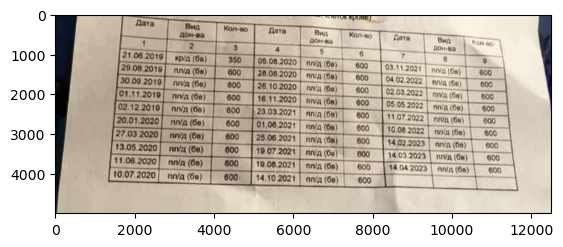

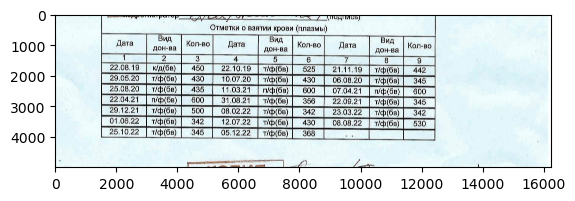

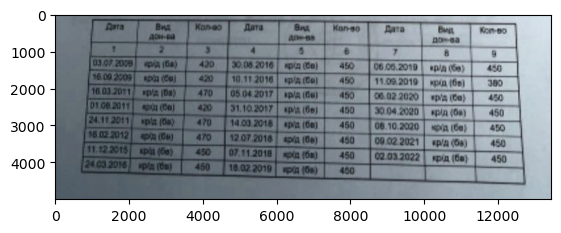

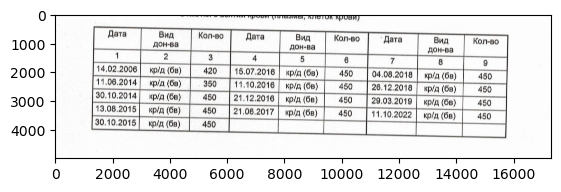

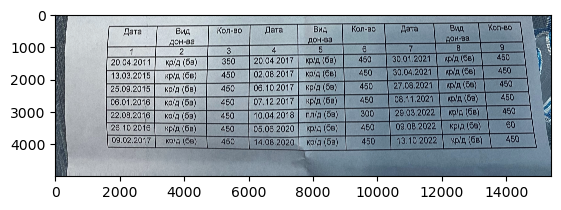

...

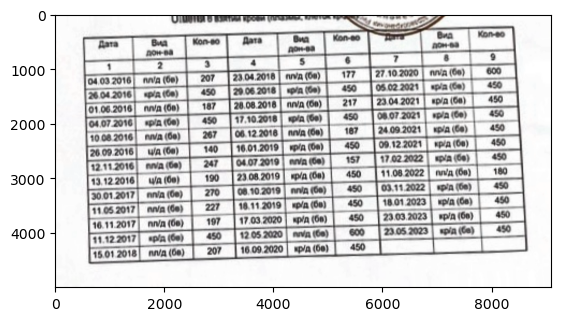

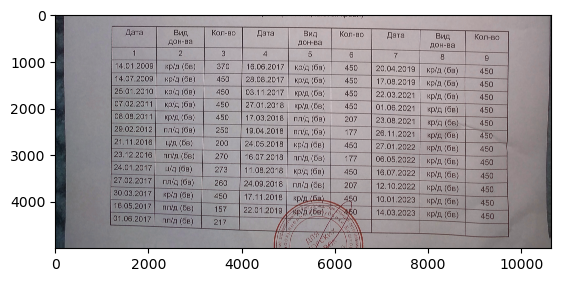

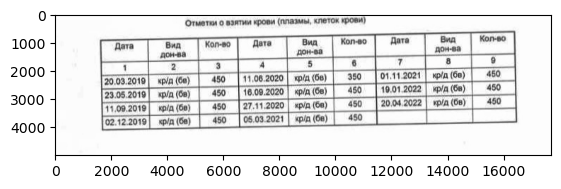

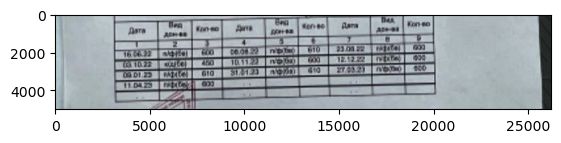

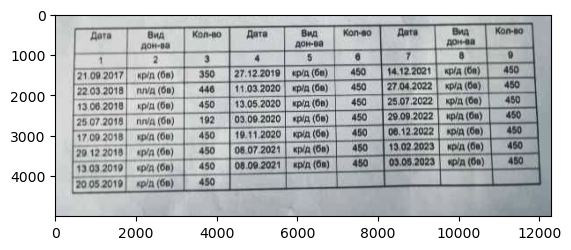

In [16]:
PATH_ = directory+'outputs_rot_tables'
DIR = Path(PATH_)

files = sorted(list(DIR.rglob('*.jpg')))
os.makedirs('outputs_r_tables', exist_ok=True)
for file in files:
    new_path = directory+'outputs_r_tables/'+str(file).split('/')[-1]
    preprocessing_image(file, new_path)
    img = cv2.imread(new_path)
    
    imshow(img)
    plt.show()

Теперь выровняем таблицы и проведем инверсию полученного результата.

In [17]:
def resize_test_image(image):
    image = cv2.resize(image, (3500, int(image.shape[0] * 3500 / image.shape[1])),
                                          interpolation=cv2.INTER_AREA)
    return image

example_image = resize_test_image(cv2.imread(str(files[7])))

In [18]:
# Функция для поиска горизонтальной грани таблицы, для последующего выравнивания таблицы по горизонтали
def longest_line(image):   
    image = cv2.resize(image, 
                       (1000,
                        int(image.shape[0] * 1000 / image.shape[1])),
                       interpolation=cv2.INTER_AREA)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    inverted_image = cv2.bitwise_not(blur)
    
    # Поиск горизонтальных линий
    kernel_hor = cv2.getStructuringElement(cv2.MORPH_RECT, (4, 4))
    hor = np.array([[1,1,1,1,1,1]])
    vertical_lines_eroded_image = cv2.erode(inverted_image, hor, iterations=5)
    
    # Расширение горизонтальных линий
    vertical_lines_eroded_image = cv2.dilate(vertical_lines_eroded_image, hor, iterations=5)
    
    # Расширение всех элементов и бинаризация
    vertical_lines_eroded_image = cv2.dilate(vertical_lines_eroded_image, kernel_hor, iterations=3)
    vertical_lines_eroded_image = cv2.threshold(vertical_lines_eroded_image, 110, 255, cv2.THRESH_BINARY)[1]
        
    # Обнаружение границ в изображении с помощью оператора Canny. 
    edges = cv2.Canny(vertical_lines_eroded_image, 50, 150, apertureSize=3)
     
    # Поиск линий при помощи преобразования Хафа и выделение самой длинной. Считаем, что это горизонтальная грань таблицы. 
    lines = cv2.HoughLinesP(edges, rho=1, theta=np.pi/180, threshold=105, minLineLength=100, maxLineGap=5)
    longest_line = max(lines, key=lambda line: line[0][2] - line[0][0])
    
    return longest_line

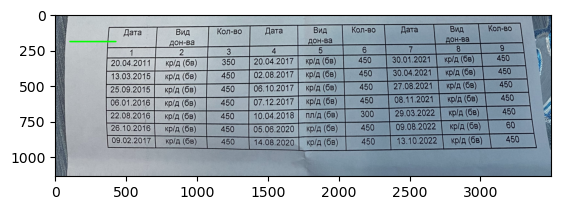

In [19]:
# пример поиска горизонтальной грани таблицы
example_longest_line = longest_line(example_image.copy())
picture = cv2.line(example_image.copy(), 
                   (example_longest_line[0][0], example_longest_line[0][1]),
                   (example_longest_line[0][2], example_longest_line[0][3]), 
                   (0, 255, 0),10)
imshow(picture)

In [20]:
# Функция поиска угла наклона таблицы
def find_angle(table_line):
    PI = 3.14159265
    angle_rad = math.atan2(table_line[0][3] - table_line[0][1], table_line[0][2] - table_line[0][0])
    angle_deg = math.degrees(angle_rad)
    return angle_deg

# Функция выравнивания таблицы по горизонтали
def rotate_image(image, angle):
    image_center = tuple(np.array(image.shape[1::-1]) / 2)
    rot_mat = cv2.getRotationMatrix2D(image_center, angle, 1.0)
    result = cv2.warpAffine(image, rot_mat, image.shape[1::-1], flags=cv2.INTER_LINEAR)
    return result

In [21]:
example_angle = find_angle(example_longest_line)
example_rotate_image = resize_test_image(rotate_image(example_image.copy(), example_angle))

In [23]:
def prepare_image(file_name, file_new_path=None):
    image = cv2.imread(file_name)
    line = longest_line(image.copy())
    angle = find_angle(line)
    image = rotate_image(image, angle)
    
    # Преобразование изображения в оттенки серого
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    #инвертируем цвета, фон становится черным
    inverted_image = cv2.bitwise_not(gray)
    
    if new_path is not None:
        cv2.imwrite(file_new_path, inverted_image)
    
    return inverted_image

Посмотрим, что получилось. Отлично, теперь наши фотографии готовы к распознаванию.

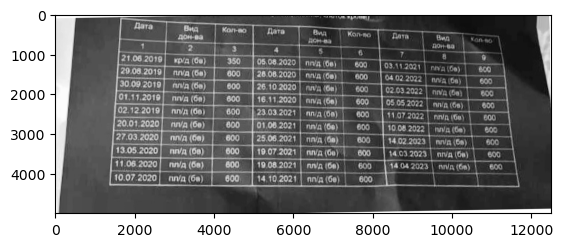

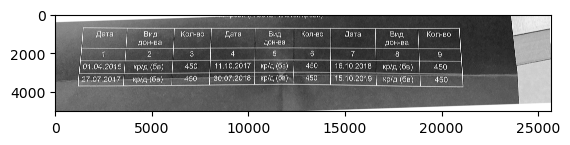

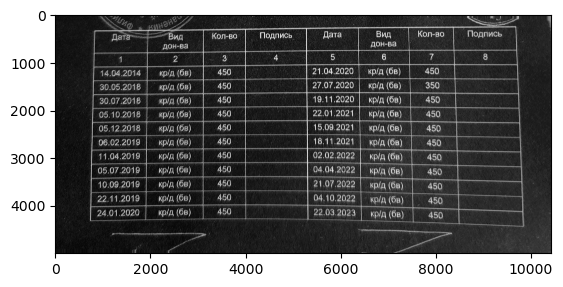

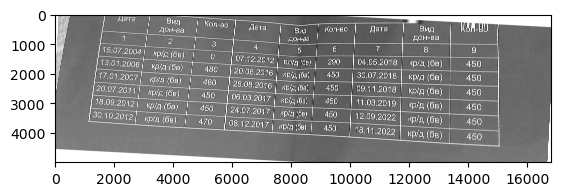

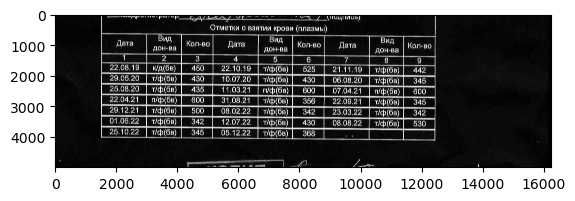

...

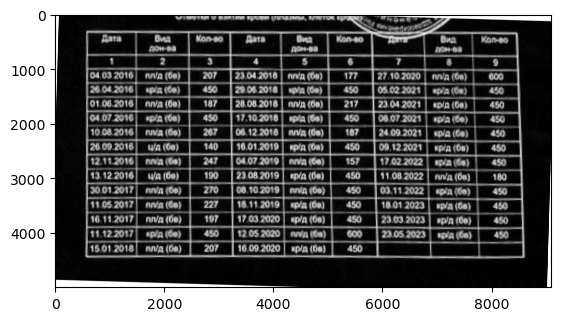

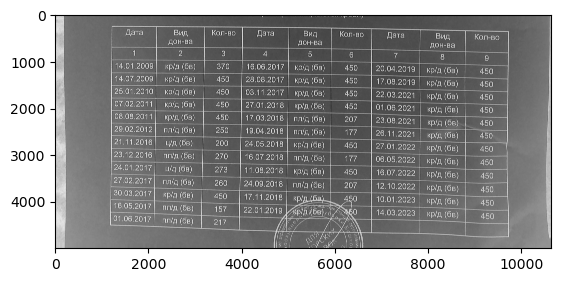

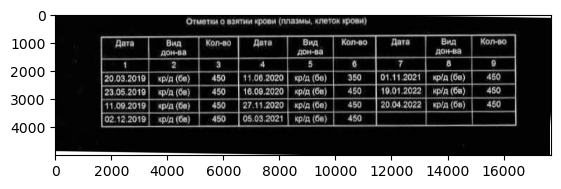

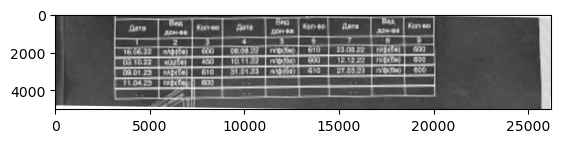

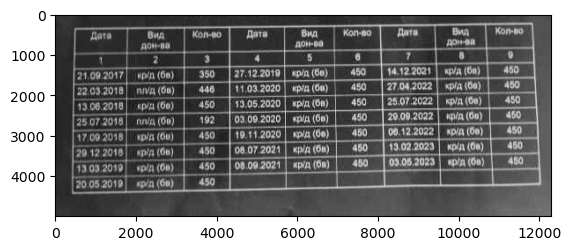

In [24]:
PATH_ = directory+'outputs_r_tables'
DIR = Path(PATH_)

files = sorted(list(DIR.rglob('*.jpg')))
os.makedirs('outputs_inverted_tables', exist_ok=True)
for file in files:
    new_path = directory+'outputs_inverted_tables/'+str(file).split('/')[-1]
    prepare_image(str(file), new_path)
    img = cv2.imread(new_path)
    
    imshow(img, color = 'gray')
    plt.show()

## 3. Распознавание текста

Изначально рассматривались к использованию две библиотеки: pytesseract и easyocr. Одним из самых существенным минусов pytesseract является то, что модель очень плохо распознает текст на фотографиях с ненадлежащим качеством. Это критичный момент, т.к. у нас в выборке таких фото может быть много. Несомненым преимуществом easyocr перед другими моделями для распознавания еще и является то, что в нее встроены такие продвинутые алгоритмы детекции текста как CRAFT, что окончательно определило наш выбор в пользу этой  библиотеки.

In [25]:
# Функция для распознавания текста в предобработанной табличке
def easyocr_results(image):
    result = easyocr.readtext(image, 
                              height_ths=0.9, 
                              width_ths=0.9, 
                              text_threshold=0.6, 
                              contrast_ths=0.3,
                              min_size=1
                              )
    return result    

Посмотрим, что получилось

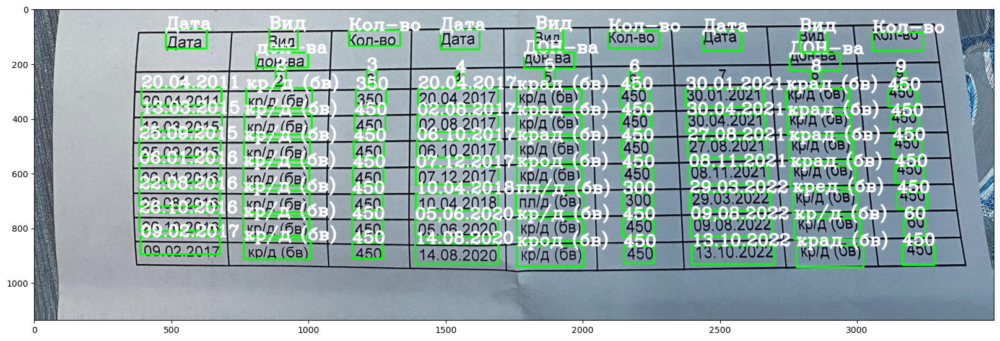

In [26]:
# Пример распознавания текста из таблицы
example_inverted_image = resize_test_image(cv2.imread('/kaggle/working/outputs_inverted_tables/233749.jpg'))

example_result_easyocr = easyocr_results(example_inverted_image)

def easyocr_to_image(image, result_easyocr):
    img = image.copy()
    for detection in result_easyocr:
        top_left = tuple((int(val) for val in detection[0][0]))
        bottom_right = tuple((int(val) for val in detection[0][2]))
        text = detection[1]
        img = cv2.rectangle(img, top_left, bottom_right, (0,255,0), 5)
        font = cv2.FONT_HERSHEY_COMPLEX
        img = cv2.putText(img, text, top_left, font, 2, (255,255,255), 5, cv2.LINE_AA)
    return img

plt.figure(figsize=(20,20))
plt.imshow(easyocr_to_image(example_rotate_image, example_result_easyocr))

В проекте для переноса значений в таблицу был использован следующий подход. Все распознанные EasyOCR текстовые поля имеют координаты, а поля, находящиеся на одной строчке имеют приблизительно одинаковые значения координат по вертикали. Зная данную особенность, все детектированные текстовые поля можно заключить в списки, где каждый список является отдельной строчкой. Условием для генерации нового списка (т.е. переход на новую строчку) - различие в координатах по вертикали для конкретного текстового поля и среднего значения координат для данной строки более 0,1. Таким образом мы получим списки состоящие из итераций ['Дата', 'Вид донорства', 'Количество']. Из полученных списков необходимые значения уже можно перенести в таблицу.

In [27]:
os.remove('/kaggle/working/outputs_inverted_tables/240493.jpg')

In [28]:
# Функция для переноса результатов EasyOCR в списки
def easyocr_to_list(results_ocr):
    list_row = []
    table = []
    mean_height = results_ocr[0][0][2][1]
    for result in results_ocr:
        if (result[0][2][1] - mean_height) / mean_height < 0.1:
            list_row.append(result[1])
            mean_height =  (mean_height + result[0][2][1]) / 2
        else:
            table.append(list_row)
            list_row = []
            mean_height = result[0][2][1]
            list_row.append(result[1])
    table.append(list_row) 
    return table

In [29]:
# Функция для перевода списков в табличные данные
def easyocr_to_dataframe(list_of_rows):
    list_row = []
    table = []
    for row in list_of_rows:
        for donation_date in range(0, len(row), 3):
            try:
                list_row = []
                list_row.append(row[donation_date])
                list_row.append(row[donation_date + 1])
                if len(list_row) == 2:
                    table.append(list_row)
            except:
                pass
        if len(list_row) == 2:
            table.append(list_row)
    # создадим табличку с датой и типом донации
    df = pd.DataFrame(table, columns=['date','type'])
    return df

Посмотрим промежуточный результат

In [30]:
example_list_of_rows = easyocr_to_list(example_result_easyocr)
example_df = easyocr_to_dataframe(example_list_of_rows)
example_df.tail(5)

,date,type
30,09.02.2017,кр/д (бв)
31,14.08.2020,крод (бв)
32,13.10.2022,крад (бв)
33,Вид,Вид
34,Вид,Вид


Далее нам необходима обработка текста для вывода результатов в необходимом для заказдчика формате:
- **Класс крови - "Цельная кровь", "Плазма", "Тромбоциты"**
- **Дата донации - "dd.mm.yyyy"**
- **Тип донации - "Безвозмездно", "Платно"** 

При невозможности заполнения поля по заданным паттернам, пользователю предлагается выводить значение ``Нужен ручной ввод``

В таблице присутствуют неподходящие для ячейки в столбце с датой. Для удаления данных ячеек посчитаем количество цифр и длину строки в ячейках столбца ``date``. Нас будут интересовать только те строки в таблице, где количество цифр в ячейке с датой будет больше 5, а общее количество символов меньше 12.

In [31]:
BLOOD_CLASS = {
    'Цельная кровь': 'кр~ы9бо',
    'Тромбоциты': 'цф',
    'Плазма': 'пшиъ['
}

DONATION_TYPE = {
    'Безвозмездно': 'бвзоаеы06389', 
    'Платно': 'п'
}

def transform(string, dictionary):
    convert_value = 'Нужен ручной ввод'
    for key, values in dictionary.items():
        if any(((char in values) for char in string.lower())):
            convert_value = key
            break
    return convert_value

In [32]:
# Функция преобразования Даты донации
def transform_donation_date(value):
    for i in value:
        if i in ')(}{][|\/liI"':
            i_index = list(value).index(i)
            value = value[:i_index] + '' + value[i_index+1:]
        if i in "OCGDQPПОСРocосqdp":
            i_index = list(value).index(i)
            value = value[:i_index] + '0' + value[i_index+1:] 
    value = "".join(value.split())
    if value[-4] in '.,':
        value += '0'
    if (len(value) == 9) and (re.match(r"\w{2}\W\w{6}", value) != None):
        value = value[:2] + '.' + value[3:5] + '.' +value[5:]
    if (len(value) == 9) and (re.match(r"\w{4}\W\w{4}", value) != None):
        value = value[:2] + '.' + value[2:4] + '.' +value[5:]
    if (len(value) == 8) and (re.match(r"\w{8}", value) != None):
        value = value[:2] + '.' + value[2:4] + '.' +value[4:]  
    if (len(value) == 8) and (re.match(r"\w{2}\W\w{2}\W\w{2}", value) != None):
        value = value[:6] + '20' + value[6:]
    if (len(value) == 10) and (re.match(r"\w{2}\W\w{2}\W\w{4}", value) != None):
        value = value[:2] + '.' + value[3:5] + '.' +value[6:]
        value = value[:6] + '20' + value[8:]
    if (value[-4:-2] == '20') and value[-5] != '.':
        value = value[:-4] + '.' + value[-4:]
    if value[0] in '96ао':
        value = '0' + value[1:]
    if value[0] in '7':
        value = '1' + value[1:]
    if value[0] in '8BВ':
        value = '3' + value[1:]
    if (len(value) == 8) and (re.match(r"\w{3}\W\w{4}", value) != None):
        value = value[:2] + '.1' + value[2:]
    if value[3] in '496ао':
        value = value[:3] + '0' + value[4:]
    if (value[3] == '1') and (value[4] in '98653ао'):
        value = value[:4] + '0' + value[5:]
    if (value[3] == '1') and (value[4] in '7'):
        value = value[:4] + '1' + value[5:]
    if len(value) > 10:
        convert_value = ''
        dot_counter = 0
        for i in range(len(value)):
            if value[i].isalnum() == True:
                dot_counter = 0
                convert_value += value[i]
            if value[i].isalnum() == False:
                dot_counter += 1
                if dot_counter == 1:
                    convert_value += '.'
        value = convert_value
    if len(value) > 10:
        value = value[1:]
    
    return value

In [33]:
# Функция для сортировки таблицы по дате 
def sort_date(dataframe):
    try:
        dataframe.iloc[:,1] =  pd.to_datetime(dataframe.iloc[:,1], format='%d.%m.%Y') 
        dataframe.sort_values(by=dataframe.columns[1], inplace=True, ignore_index=True)
        dataframe.iloc[:,1] = dataframe.iloc[:,1].apply(lambda x: x.strftime('%d.%m.%Y'))
    except:
        pass
    return dataframe

In [34]:
# получение результатов распознавания
def extract_data(image):
    result_easyocr = easyocr_results(image)
    result = easyocr_to_list(result_easyocr)
    df = easyocr_to_dataframe(result)
    df['digit_num'] = df['date'].apply(lambda x: [(i).isdigit() for i in x].count(True))
    df['row_lenth'] = df['date'].apply(lambda x: len(x))

    df = df.query('digit_num > 5 and row_lenth < 12')
    df['Класс крови'] = df.iloc[:, 1].apply(lambda x: transform(x[:3], BLOOD_CLASS))
    df['Дата донации'] = df.iloc[:, 0].apply(lambda x: transform_donation_date(x))
    df['Тип донации'] = df.iloc[:, 1].apply(lambda x: transform(x[1:], DONATION_TYPE))

    df.drop_duplicates(inplace=True)
    df = df.loc[:, ['Класс крови', 'Дата донации', 'Тип донации']]
    df = sort_date(df)

    return df

In [35]:
example_df = extract_data(example_inverted_image)
example_df

,Класс крови,Дата донации,Тип донации
0,Цельная кровь,20.04.2011,Безвозмездно
1,Цельная кровь,13.03.2015,Безвозмездно
2,Цельная кровь,25.09.2015,Безвозмездно
3,Цельная кровь,06.01.2016,Безвозмездно
4,Цельная кровь,22.08.2016,Безвозмездно
5,Цельная кровь,26.10.2016,Безвозмездно
6,Цельная кровь,09.02.2017,Безвозмездно
7,Цельная кровь,20.04.2017,Безвозмездно
8,Цельная кровь,02.08.2017,Безвозмездно
9,Цельная кровь,06.10.2017,Безвозмездно


Визуально сравним нашу таблицу с валидационными таблицами от заказчика.

In [36]:
columns_to_read = ['Класс крови', 'Дата донации', 'Тип донации']
example_valid_df = pd.read_csv(str(valid_tables[7]), usecols=columns_to_read)
print('Таблица, извлеченная из изображения разработанным алгоритмом')
display(example_df)
print('Контрольная таблица от заказчика')
display(example_valid_df)

Таблица, извлеченная из изображения разработанным алгоритмом


,Класс крови,Дата донации,Тип донации
0,Цельная кровь,20.04.2011,Безвозмездно
1,Цельная кровь,13.03.2015,Безвозмездно
2,Цельная кровь,25.09.2015,Безвозмездно
3,Цельная кровь,06.01.2016,Безвозмездно
4,Цельная кровь,22.08.2016,Безвозмездно
5,Цельная кровь,26.10.2016,Безвозмездно
6,Цельная кровь,09.02.2017,Безвозмездно
7,Цельная кровь,20.04.2017,Безвозмездно
8,Цельная кровь,02.08.2017,Безвозмездно
9,Цельная кровь,06.10.2017,Безвозмездно


Контрольная таблица от заказчика


,Класс крови,Дата донации,Тип донации
0,Цельная кровь,20.04.2011,Безвозмездно
1,Цельная кровь,13.03.2015,Безвозмездно
2,Цельная кровь,25.09.2015,Безвозмездно
3,Цельная кровь,06.01.2016,Безвозмездно
4,Цельная кровь,22.08.2016,Безвозмездно
5,Цельная кровь,26.10.2016,Безвозмездно
6,Цельная кровь,09.02.2017,Безвозмездно
7,Цельная кровь,20.04.2017,Безвозмездно
8,Цельная кровь,02.08.2017,Безвозмездно
9,Цельная кровь,06.10.2017,Безвозмездно


## 4. Расчет метрики. Accuracy for table.

В качестве метрики использовался расчет `Accuracy` для количества верно распознанных ячеек. `Дата донации` использовалась как уникальный ключ, по которому проходила проверка случая донации. При правильном распознавании даты, проводилась дальнейшая проверка сходства `Класса крови` и `Типа донации`. Однако данный алгоритм не будет учитывать верно распознанные строки, где присутствует несоответсвие `Даты донации`,хотя оставшиеся поля могут быть распознаны верно. Для решение данной проблемы, была реализована возможность наличия максимально 3 ошибок в распознавании даты, при посимвольном сравнении даты. При этом стоки, которые уже сравнивались, в дальнейшем анализе не участвовали, чтобы исключить возможность повторного сравнения (например целевое значение: `21.10.2020`, наш алгоритм распознал различающиеся в одном символе значения `11.10.2020` и `21.10.2022`. В качестве правильной будет распознана только одна строка, вторая будет сравниваться с оставшимися строками. 

In [37]:
# Функция расчета Accuracy
def calculate_accuracy(df, valid_df):
    modif_df = df.set_index('Дата донации')
    modif_valid_df = valid_df.set_index('Дата донации')
    correct_recognition = 0
    true_index = 0
    for index in modif_df.index:
        if index in modif_valid_df.index:
            correct_recognition += (modif_df.loc[index,:] == modif_valid_df.loc[index,:]).sum().sum() + 1
            modif_df.drop(index, inplace=True)
            modif_valid_df.drop(index, inplace=True)
    for match_num in [9, 8, 7]:
        for index in modif_df.index:
            flag = False
            for index_valid in modif_valid_df.index:
                match_counter = 0
                for i in range(len(str(index))):
                    if str(index)[i] == str(index_valid)[i]:
                        match_counter += 1
                        if match_counter == match_num:
                            correct_recognition += (modif_df.loc[index,:] == modif_valid_df.loc[index_valid,:]).sum().sum()
                            modif_df.drop(index, inplace=True)
                            modif_valid_df.drop(index_valid, inplace=True)
                            flag = True
                        if(flag):
                            break 
                    if(flag):
                            break 
            
    total_recognition = len(valid_df) * 3
    accuracy = correct_recognition / total_recognition 
    
    return accuracy

In [38]:
# Пример расчета Accuracy
print('Accuracy равна', round(calculate_accuracy(example_df, example_valid_df),2))

Accuracy равна 1.0


## 5. Валидация полученных данных

In [39]:
PATH_ = directory+'outputs_inverted_tables'
DIR = Path(PATH_)

files = sorted(list(DIR.rglob('*.jpg')))
list_of_final_data_frames = []

for file in files:
    image = cv2.imread(str(file))
    df = extract_data(image)
    list_of_final_data_frames.append(df) 
    print('Имя файла', str(file).split('/')[-1])
    display(df)
    

Имя файла 141899.jpg


,Класс крови,Дата донации,Тип донации
4,Плазма,21.10.2019,Безвозмездно
5,Цельная кровь,05.06.2020,Безвозмездно
6,Плазма,29.05.2019,Безвозмездно
7,Нужен ручной ввод,28.06.2020,Безвозмездно
13,Цельная кровь,01.11.2018,Безвозмездно
14,Плазма,1612329,Безвозмездно
15,Плазма,0505222,Безвозмездно
16,Плазма,02.12.2018,Безвозмездно
17,Плазма,23.03.2021,Безвозмездно
18,Плазма,01.07.2022,Безвозмездно


Имя файла 204119.jpg


,Класс крови,Дата донации,Тип донации
0,Цельная кровь,01.04.2015,Безвозмездно
1,Цельная кровь,27.07.2017,Безвозмездно
2,Цельная кровь,11.10.2017,Безвозмездно
3,Цельная кровь,30.07.2018,Безвозмездно
4,Цельная кровь,16.10.2018,Безвозмездно
5,Цельная кровь,15.10.2019,Безвозмездно


Имя файла 213950.jpg


,Класс крови,Дата донации,Тип донации
0,Цельная кровь,14.04.2014,Безвозмездно
1,Цельная кровь,30.05.2018,Безвозмездно
2,Цельная кровь,30.07.2018,Безвозмездно
3,Цельная кровь,05.10.2018,Безвозмездно
4,Цельная кровь,05.12.2018,Безвозмездно
5,Цельная кровь,06.02.2019,Безвозмездно
6,Цельная кровь,11.04.2019,Безвозмездно
7,Цельная кровь,05.07.2019,Безвозмездно
8,Цельная кровь,10.09.2019,Безвозмездно
9,Цельная кровь,22.11.2019,Безвозмездно


Имя файла 225629.jpg


,Класс крови,Дата донации,Тип донации
0,Нужен ручной ввод,15.07.2004,Нужен ручной ввод
1,Нужен ручной ввод,13.01.2006,Безвозмездно
2,Цельная кровь,17.01.2007,Безвозмездно
3,Нужен ручной ввод,20.07.2011,Безвозмездно
4,Цельная кровь,18.09.2012,Безвозмездно
5,Нужен ручной ввод,30.10.2012,Безвозмездно


Имя файла 227414.jpg


,Класс крови,Дата донации,Тип донации
0,Цельная кровь,22.08.2019,Безвозмездно
1,Тромбоциты,22.10.2019,Безвозмездно
2,Тромбоциты,21.11.2019,Безвозмездно
3,Тромбоциты,29.05.2020,Безвозмездно
4,Тромбоциты,10.07.2020,Безвозмездно
5,Тромбоциты,06.08.2020,Безвозмездно
6,Тромбоциты,25.08.2020,Безвозмездно
7,Тромбоциты,11.03.2021,Безвозмездно
8,Тромбоциты,07.04.2021,Безвозмездно
9,Тромбоциты,22.04.2021,Безвозмездно


Имя файла 228963.jpg


,Класс крови,Дата донации,Тип донации
12,Цельная кровь,162019,Безвозмездно
15,Плазма,05.09.2017,Нужен ручной ввод
16,Цельная кровь,03.02.2029,Безвозмездно
28,Цельная кровь,02.11.2018,Безвозмездно
29,Плазма,055022,Безвозмездно
31,Плазма,162500,Нужен ручной ввод


Имя файла 231820.jpg


,Класс крови,Дата донации,Тип донации
0,Цельная кровь,14.02.2006,Безвозмездно
1,Цельная кровь,11.06.2014,Безвозмездно
2,Цельная кровь,30.10.2014,Безвозмездно
3,Цельная кровь,13.08.2015,Безвозмездно
4,Цельная кровь,30.10.2015,Безвозмездно
5,Цельная кровь,15.07.2016,Безвозмездно
6,Цельная кровь,11.10.2016,Безвозмездно
7,Цельная кровь,21.12.2016,Безвозмездно
8,Цельная кровь,21.06.2017,Безвозмездно
9,Цельная кровь,04.08.2018,Безвозмездно


Имя файла 233749.jpg


,Класс крови,Дата донации,Тип донации
0,Цельная кровь,20.04.2011,Безвозмездно
1,Цельная кровь,13.03.2015,Безвозмездно
2,Цельная кровь,25.09.2015,Безвозмездно
3,Цельная кровь,06.01.2016,Безвозмездно
4,Цельная кровь,22.08.2016,Безвозмездно
5,Цельная кровь,26.10.2016,Безвозмездно
6,Цельная кровь,09.02.2017,Безвозмездно
7,Цельная кровь,20.04.2017,Безвозмездно
8,Цельная кровь,02.08.2017,Безвозмездно
9,Цельная кровь,06.10.2017,Безвозмездно


Имя файла 236000.jpg


,Класс крови,Дата донации,Тип донации
0,Цельная кровь,25.11.2020,Безвозмездно
1,Цельная кровь,26.02.2021,Безвозмездно
2,Цельная кровь,09.11.2021,Безвозмездно
3,Цельная кровь,16.09.2022,Безвозмездно
4,Цельная кровь,17.02.2023,Безвозмездно


Имя файла 238716.jpg


,Класс крови,Дата донации,Тип донации
0,Цельная кровь,29.04.2008,Безвозмездно
1,Цельная кровь,05.10.2013,Безвозмездно
2,Цельная кровь,27.03.2014,Безвозмездно
3,Цельная кровь,29.07.2015,Безвозмездно
4,Цельная кровь,03.10.2015,Безвозмездно
5,Цельная кровь,18.02.2016,Безвозмездно
6,Цельная кровь,19.04.2016,Безвозмездно
7,Цельная кровь,07.07.2016,Безвозмездно
8,Цельная кровь,15.10.2016,Безвозмездно
9,Цельная кровь,17.12.2016,Безвозмездно


Имя файла 243478.jpg


,Класс крови,Дата донации,Тип донации
31,Цельная кровь,03.12.2021,Платно
37,Цельная кровь,216021199,Безвозмездно
38,Плазма,51.06.2022,Безвозмездно


Имя файла 245365.jpg


,Класс крови,Дата донации,Тип донации
0,Цельная кровь,14.01.2009,Безвозмездно
1,Цельная кровь,14.07.2009,Безвозмездно
2,Цельная кровь,25.01.2010,Безвозмездно
3,Цельная кровь,07.02.2011,Безвозмездно
4,Цельная кровь,08.08.2011,Безвозмездно
5,Плазма,29.02.2012,Безвозмездно
6,Тромбоциты,21.11.2016,Безвозмездно
7,Плазма,23.12.2016,Безвозмездно
8,Тромбоциты,24.01.2017,Безвозмездно
9,Плазма,27.02.2017,Безвозмездно


Имя файла 254586.jpg


,Класс крови,Дата донации,Тип донации
0,Цельная кровь,20.03.2019,Безвозмездно
1,Цельная кровь,23.05.2019,Безвозмездно
2,Цельная кровь,11.09.2019,Безвозмездно
3,Цельная кровь,02.12.2019,Безвозмездно
4,Цельная кровь,11.06.2020,Безвозмездно
5,Цельная кровь,27.11.2020,Безвозмездно
6,Цельная кровь,05.03.2021,Безвозмездно
7,Цельная кровь,01.11.2021,Безвозмездно
8,Цельная кровь,20.04.2022,Безвозмездно


Имя файла 256578.jpg


,Класс крови,Дата донации,Тип донации


Имя файла 256838.jpg


,Класс крови,Дата донации,Тип донации
8,Цельная кровь,10.2017,Безвозмездно
9,Плазма,27.12.2018,Безвозмездно
13,Цельная кровь,'03.2020,Безвозмездно
14,Цельная кровь,27.04.2022,Безвозмездно
16,Цельная кровь,13.05.2018,Безвозмездно
18,Цельная кровь,25.07.2022,Безвозмездно
20,Плазма,25.10.2019,Безвозмездно
21,Цельная кровь,03.09.2070,Безвозмездно
22,Нужен ручной ввод,29.09.2022,Безвозмездно
26,Цельная кровь,"00,2.2022",Безвозмездно


Посчитаем `Accuracy` по всем таблицам 

In [40]:
accuracy_for_all_tables = []
for dataframe in range(len(list_of_final_data_frames)):
    path_to_csv = str(valid_tables[dataframe])
    columns_to_read = ['Класс крови', 'Дата донации', 'Тип донации']
    data = pd.read_csv(path_to_csv, usecols=columns_to_read)
    extracted_data = list_of_final_data_frames[dataframe]
    len_df1 = len(data)
    len_df2 = len(extracted_data)
    
    if len_df1 < len_df2:
        shorter_df = data
        longer_df = extracted_data
    else:
        shorter_df = extracted_data
        longer_df = data
    
    # Append empty rows to the shorter DataFrame
    num_missing_rows = abs(len_df1 - len_df2)
    shorter_df = shorter_df.append([pd.Series(dtype=object)] * num_missing_rows, ignore_index=True)
    
    accuracy_for_all_tables.append(calculate_accuracy(shorter_df, longer_df))

In [41]:
print('Результирующие метрики по распознаванию:', accuracy_for_all_tables)
print('_________')
print('Общая accuracy:', round(sum(accuracy_for_all_tables)/len(accuracy_for_all_tables),2))

Результирующие метрики по распознаванию: [0.367816091954023, 1.0, 1.0, 0.24074074074074073, 0.95, 0.057971014492753624, 1.0, 1.0, 1.0, 1.0, 0.02631578947368421, 0.9369369369369369, 0.8181818181818182, 0.0, 0.3939393939393939]
_________
Общая accuracy: 0.65


### Выводы

*Целью данного проекта является получить рабочее решение, позволяющиее по загруженному фото получать медецинские данные в csv файл. Задача была декомпозирована на следующие этапы: извлечение таблицы, обработка фотографий и распознавание текста.*

**Для детекции были опробованы 2 подхода:**

 - **детекция таблиц методами opencv**. Это хороший вариант решения, который позволил бы избежать использования в коде сложных продуктов, но у него выявилось несколько недостатков: он плохо обрабатывает фото с артефактами (например, печатями), что требует написания дополнительного кода и не работает с некачественными, размытыми фотографиями.
 - **детекция таблиц с помощью обученной нейронной сети FAST RCNN**. Нейронная сеть хорошо находит таблицы, но у нее есть проблемы с границами на фото с искаженной перспективой и мятых листах. Эту проблему легко удалось решить с помощью расширения отступов от границ бокса.
 
**Для предобработки фотографий были опробованы следующие инструменты:**

 - **методы opencv** включающие в себя повороты изображений, цветокоррекцию и выравнивание. Этот подход оказался очень эффективным.
 - **автоэнкодеры**. В проекте не представлены из-за большого размера кода. Автоэнкодеры с латентным пространством не использовались, т.к. у нас недостаточно документов на русском языке, чтобы по ним можно было качественно обучить нейронную сеть. Поэтому использовалось прямое кодирование/декодирование изображений с помощью одного слоя свертки и пуллинга
    - автоэнкодеры для debluring. Здесь наблюдения следующие. При небольшом размытии, нейронная сеть в процессе обучения не плохо восстанавливает изображение на валидации. Но все тесты показали плохой результат. Это может быть связано с тем, что сетка вызубрила распределение в процессе обучения. Здесь можно попытаться взять за основу архитектуры сетей по типу ESPGHAN и экспериментальным путем попытаться их упростить, т.к. наше изображение – в первую очередь черно-белый документ, а не сложное графическое изображение.
   - автоэнкодеры для denoising. Эти автоэнкодеры показали себя с неплохой стороны, очищая документ от мелких артефактов, но не решили главной задачи – избавление от печатей на документах. Для обучения данной сетки в фотошопе был подготовлен специальный датасет, но данных в нем оказалось недостаточно для успешного обучения. Поэтому было принято отказаться от использования для минимизации избыточного кода.

**Распознавание текста**

Изначально рассматривались к использованию две библиотеки: **pytesseract и easyocr**. Одним из самых существенным минусов pytesseract является то, что модель очень плохо распознает текст на фотографиях с ненадлежащим качеством. Это критичный момент, т.к. у нас в выборке таких фото может быть много. Несомненным преимуществом easyocr перед другими моделями для распознавания еще и является то, что в нее встроены такие продвинутые алгоритмы детекции текста как CRAFT, что окончательно определило выбор в пользу этой  библиотеки.

**В целом, не используя сложных инструментов, нам удалось достигнуть точности в 65%. Основная проблема заключается в том, что при искажении перспективы, размытии или деформации справки, EASYOCR начинает плохо считывать данные, что приводит у ухудшению результатов работы алгоритма. Следующим этапом для развития проекта может стать приведение фотографий в надлежащее качество с написанием собственных сетей на базе архитектур GAN и автоэнкодеров.**
